# Project Template

A guide for applying machine learning on a dataset.

## Step 1: Prepare Project

1. Load libraries
2. Load dataset

In [83]:
import pandas as pd
import numpy as np
from numpy import set_printoptions
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import BaggingClassifier

In [2]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

In [3]:
# display all columns
pd.set_option('display.max_columns', None)

In [4]:
# see what we imported (data is a dictionary)
data.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [5]:
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

## Step 2: Define Problem
What is your task? What are your goals? What do you want to achieve?

The goal is to find the best classifier for predicting if someone has canser or not, by looking at the specific measurments of their tumors.

## Step 3: Exploratory Analysis
Understand your data: Take a “peek” of your data, answer basic questions about the dataset.
Summarise your data. Explore descriptive statistics and visualisations.

In [6]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [7]:
# shape of the data
df.shape

(569, 31)

In [9]:
df.dtypes

mean radius                float64
mean texture               float64
mean perimeter             float64
mean area                  float64
mean smoothness            float64
mean compactness           float64
mean concavity             float64
mean concave points        float64
mean symmetry              float64
mean fractal dimension     float64
radius error               float64
texture error              float64
perimeter error            float64
area error                 float64
smoothness error           float64
compactness error          float64
concavity error            float64
concave points error       float64
symmetry error             float64
fractal dimension error    float64
worst radius               float64
worst texture              float64
worst perimeter            float64
worst area                 float64
worst smoothness           float64
worst compactness          float64
worst concavity            float64
worst concave points       float64
worst symmetry      

In [10]:
for col in df.columns:
    shape_info = f"The shape of the column \033[94m{col}\033[0m is \033[92m{df[col].shape}\033[0m and it has \033[91m{df[col].isnull().sum()}\033[0m null values"
    print(shape_info)

The shape of the column mean radius is (569,) and it has 0 null values
The shape of the column mean texture is (569,) and it has 0 null values
The shape of the column mean perimeter is (569,) and it has 0 null values
The shape of the column mean area is (569,) and it has 0 null values
The shape of the column mean smoothness is (569,) and it has 0 null values
The shape of the column mean compactness is (569,) and it has 0 null values
The shape of the column mean concavity is (569,) and it has 0 null values
The shape of the column mean concave points is (569,) and it has 0 null values
The shape of the column mean symmetry is (569,) and it has 0 null values
The shape of the column mean fractal dimension is (569,) and it has 0 null values
The shape of the column radius error is (569,) and it has 0 null values
The shape of the column texture error is (569,) and it has 0 null values
The shape of the column perimeter error is (569,) and it has 0 null values
The shape of the column area error 

In [8]:
# summary statistics for every column
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


We can see that there are 10 columns for each group.

- The mean group 
- The error group 
- The worst group 

So if we would like to deep dive to the data we have to compare one collumn of every group together.
For example we may need to compare the mean radius + radius error + worst radius

In [11]:
# we see the distribution of the target variable
df.groupby('target').size()

target
0    212
1    357
dtype: int64

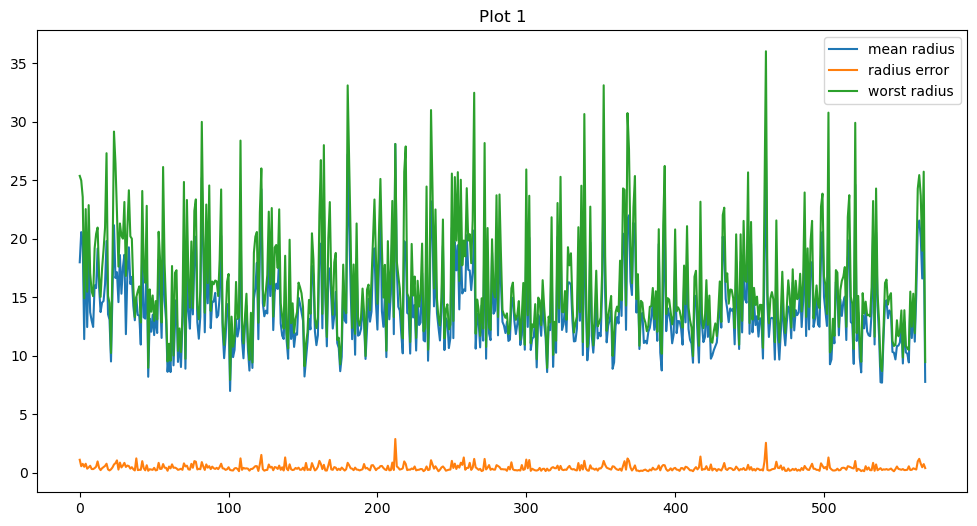

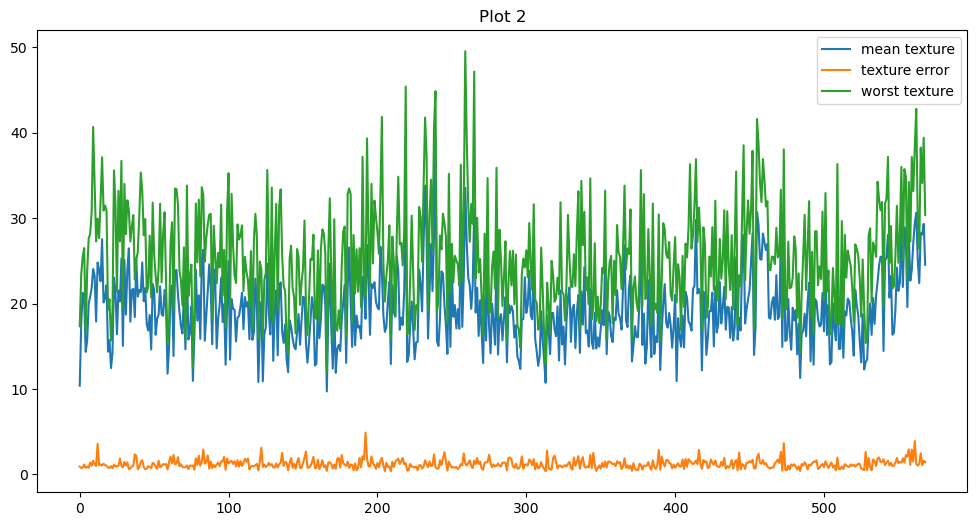

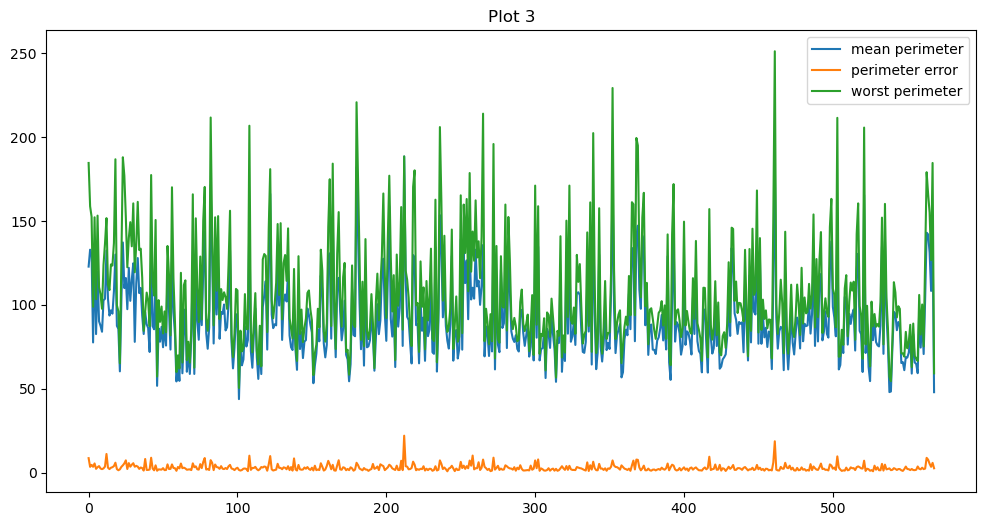

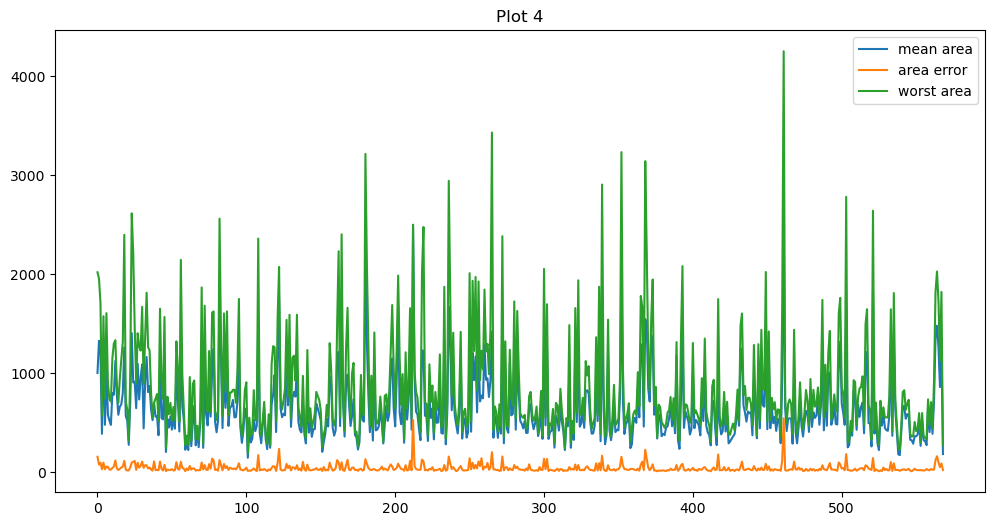

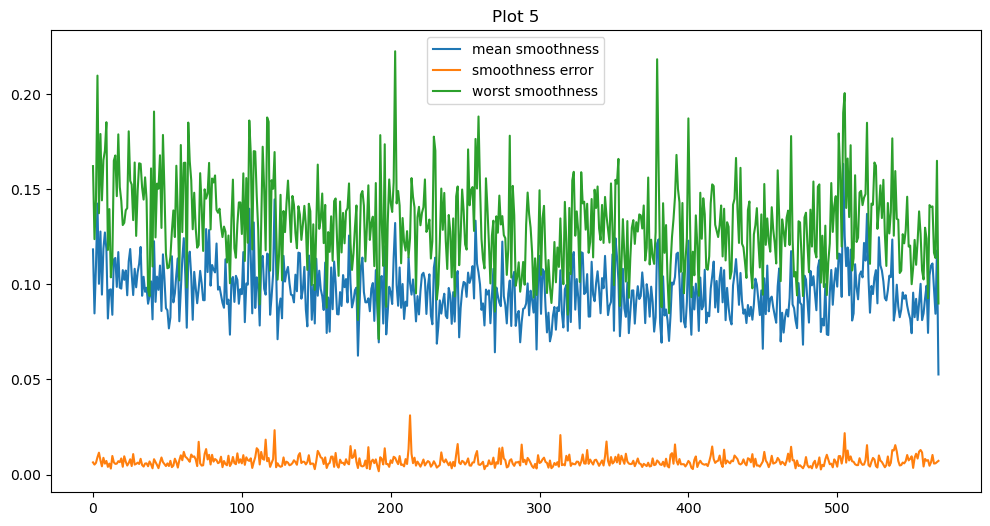

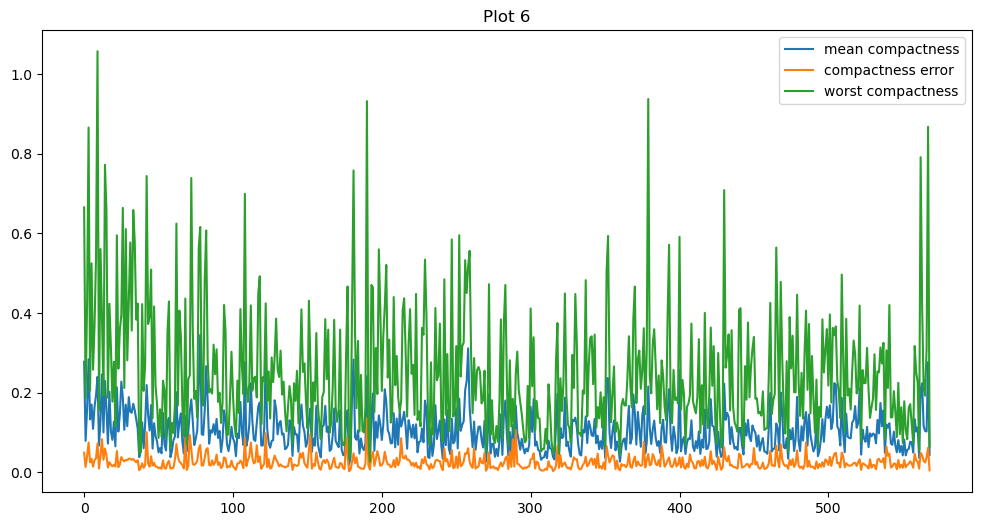

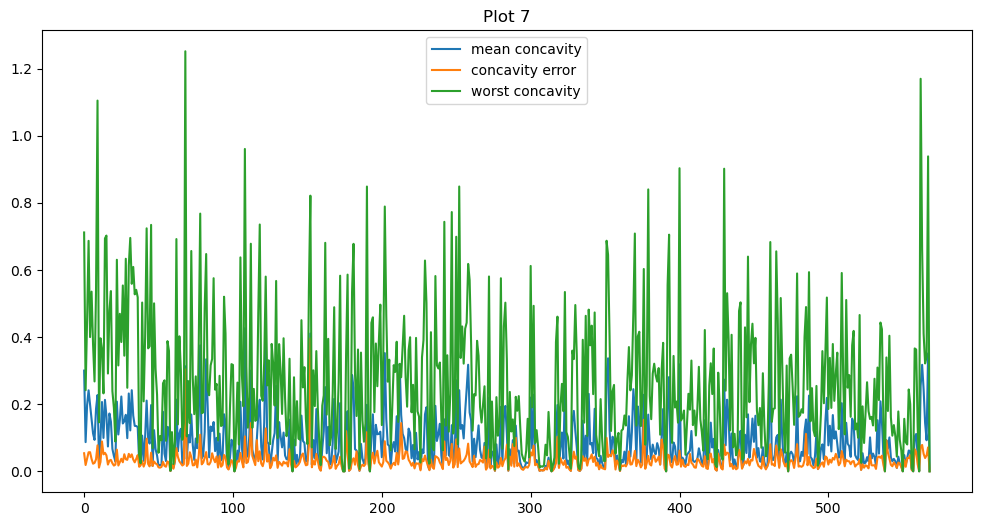

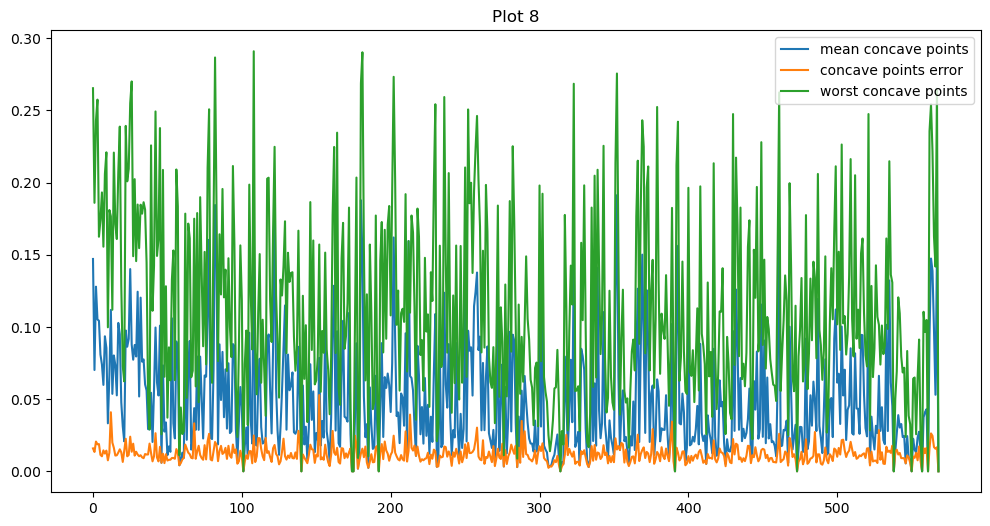

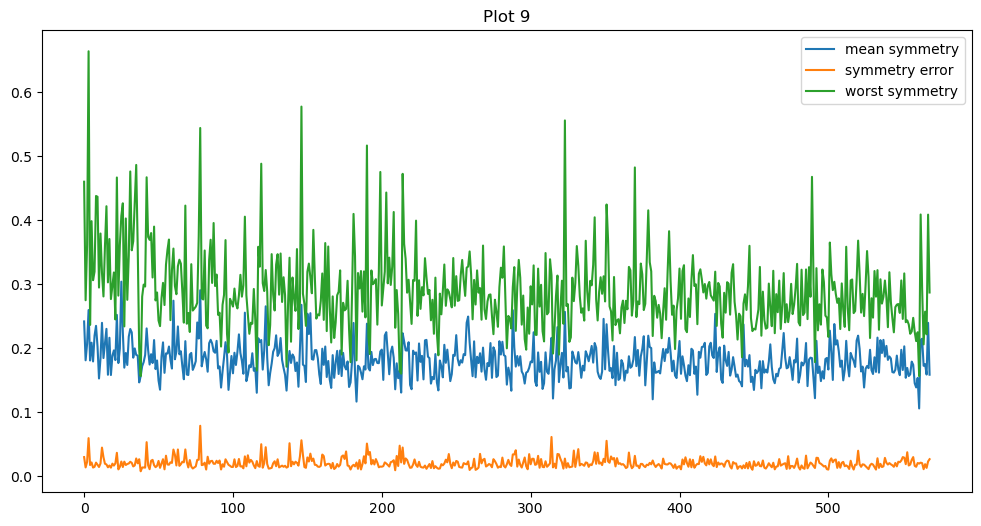

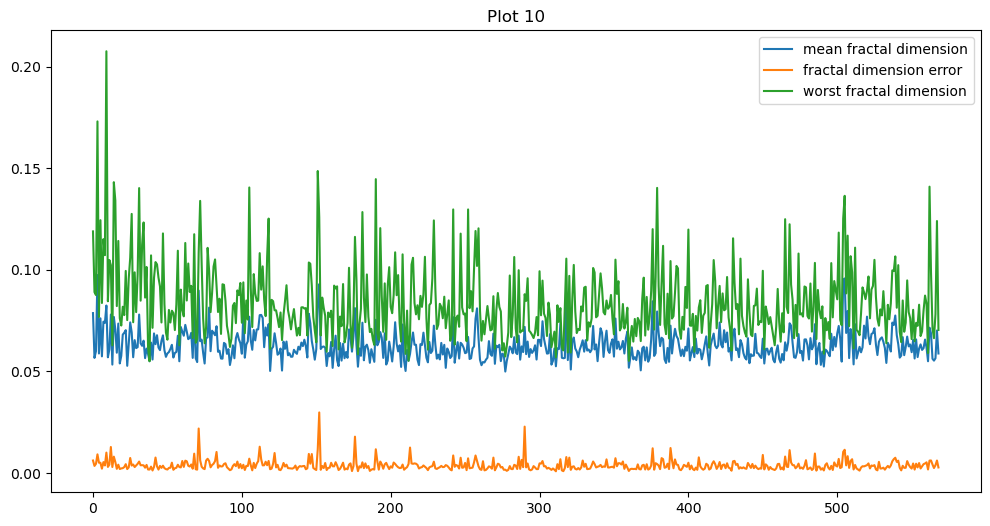

In [12]:
# Lets plot by group and see if we find any patterns 
num_plots = 10

cols_per_plot = 3
for plot_index in range(num_plots):
    plt.figure(figsize=(12, 6))

    # columns in the current plot
    for col_offset in range(cols_per_plot):
        col_index = plot_index + col_offset * num_plots
        plt.plot(df.index, df[df.columns[col_index]], label= df.columns[col_index])

    plt.title(f'Plot {plot_index + 1}')
    plt.legend()
    plt.show()

We see that there are some outliers that may cause us some problems, but with no domain knowledge, and not knowing what machine got the measurments, we cant drop them, so we continue as it is and we may need to consult with a doctor if we want more information about the meaning behind each group.

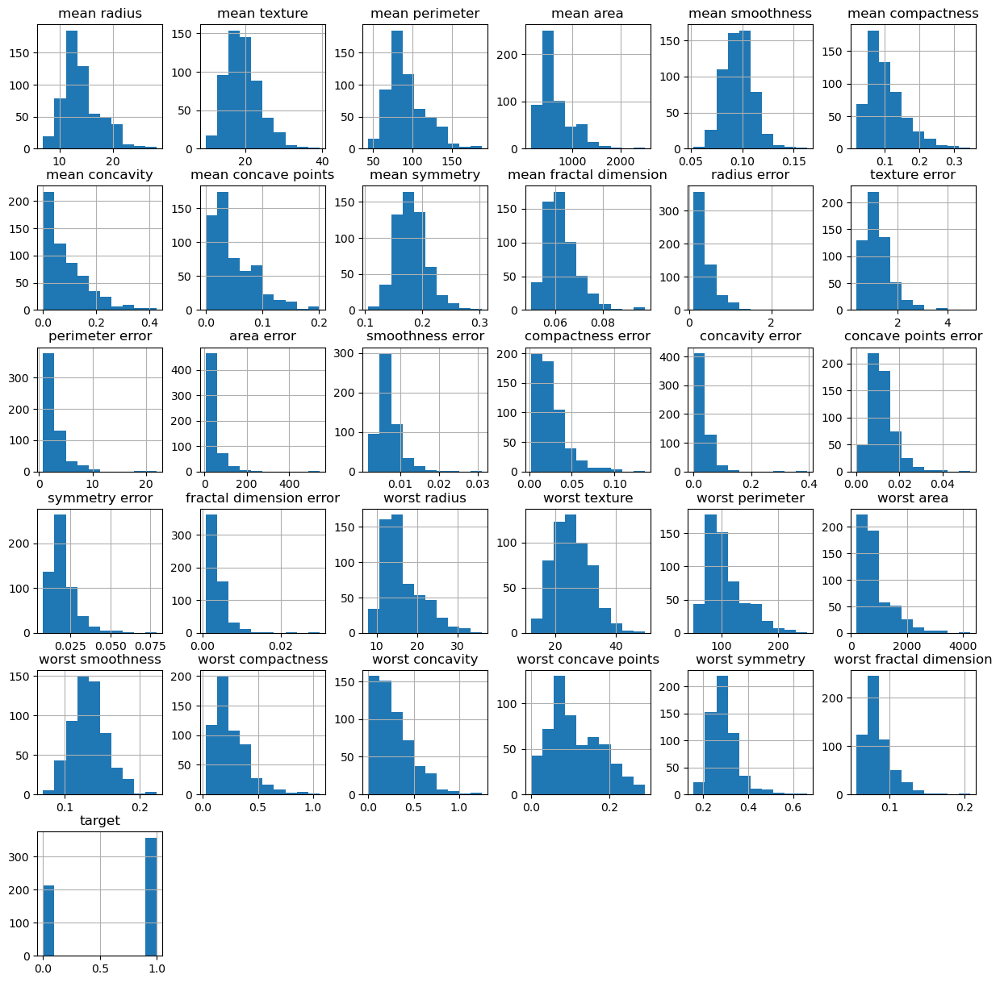

In [13]:
# the distribution of the columns of the dataframe
df.hist(layout=(6, 6), figsize=(15, 15))
plt.show()

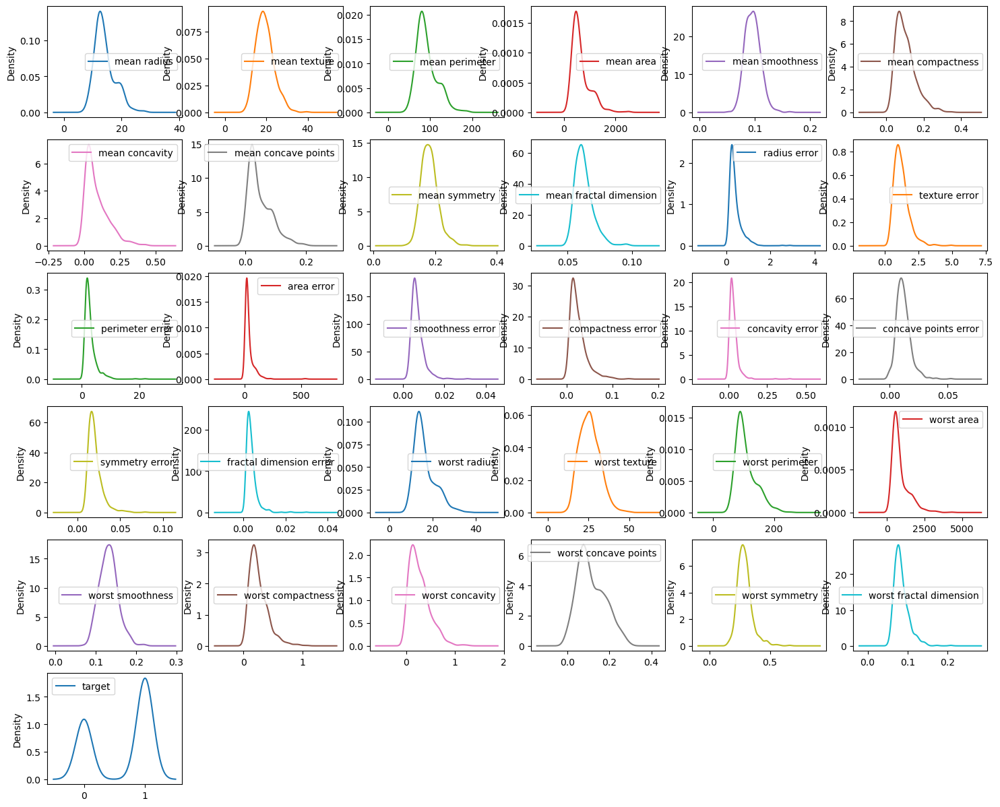

In [14]:
df.plot(kind='density', subplots=True, layout=(6,6), figsize=[18,15], sharex=False)
plt.show()

The density plot doesn't provide more meaningful insights than the histogram, so I will use a box plot to identify outliers in each column.

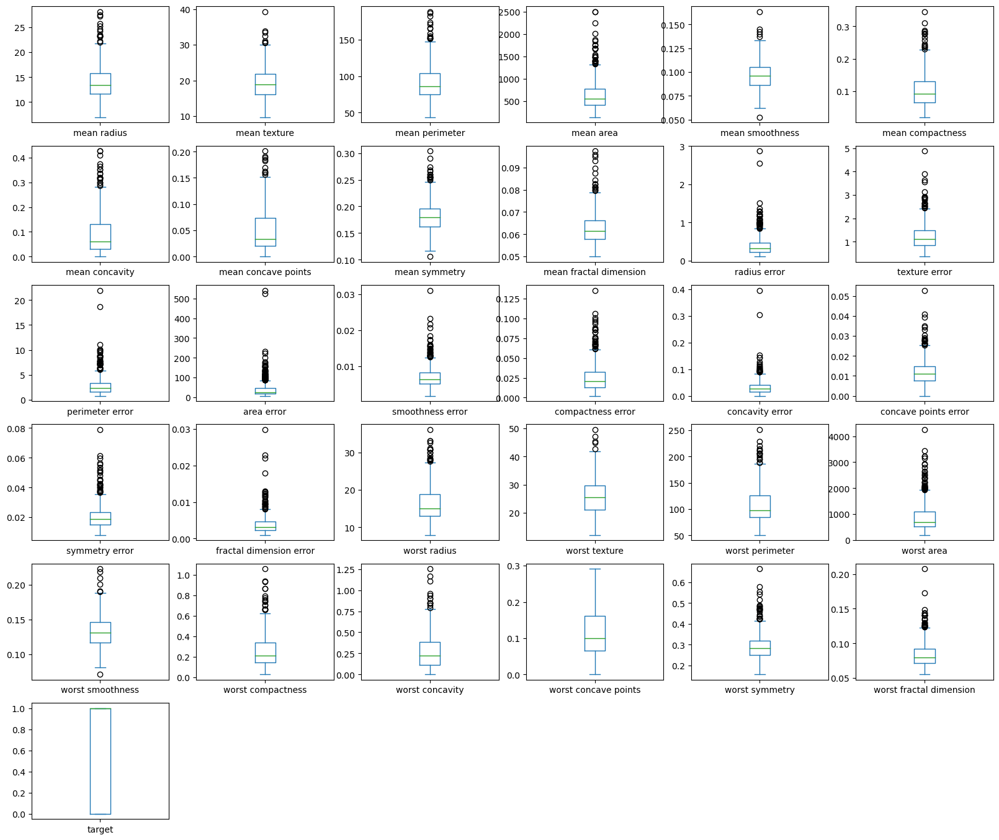

In [15]:
df.plot(kind='box', subplots=True, layout=(6,6),figsize=[20,17], sharex=False, sharey=False)
plt.show()

/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated a

<Axes: >

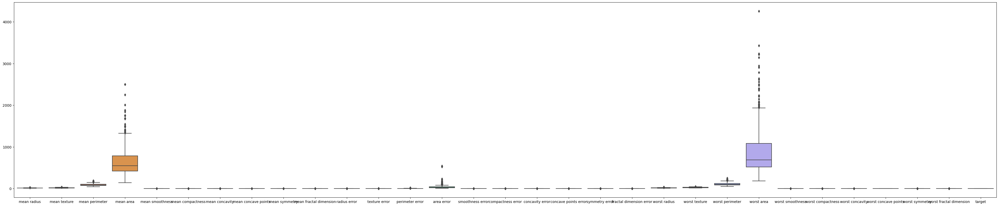

In [16]:
# ploting all the columns against each other
plt.figure(figsize=(50,10))
sns.boxplot(data=df)

/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated a

<Axes: >

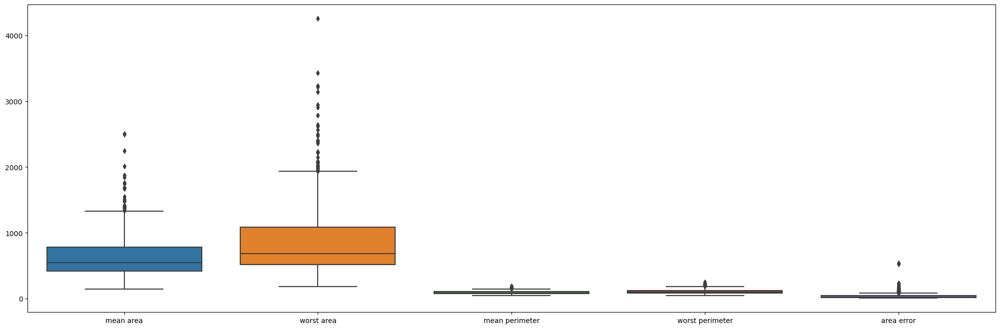

In [17]:
# ploting the 5 columns with the highest values
tmp_df = df[['mean area', 'worst area', 'mean perimeter', 'worst perimeter', 'area error']]
plt.figure(figsize=(25,8))
sns.boxplot(data=tmp_df)

/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/tselentis/miniconda3/envs/dtsc3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated a

<Axes: >

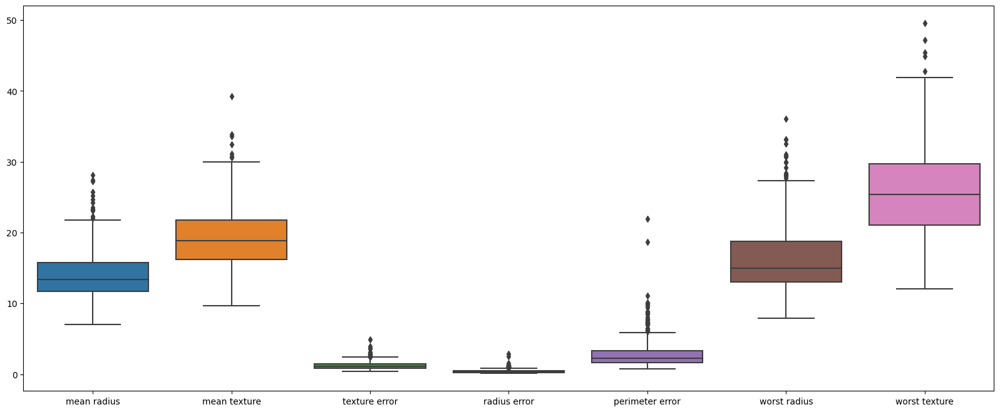

In [18]:
# ploting the rest 18 columns
tmp_df_2 = df[['mean radius', 'mean texture','texture error','radius error' , 'perimeter error', 'worst radius', 'worst texture']]
plt.figure(figsize=(20,8))
sns.boxplot(data=tmp_df_2)

We can see that for 18 of 30 columns are having values less than 40, so this implies that if i use the other collumns i will need to normalize the dataset.
The 3 plot above are not in any mean corelated between them, they just seem to have metrics that are close and ploting them give use a representation other scale they are

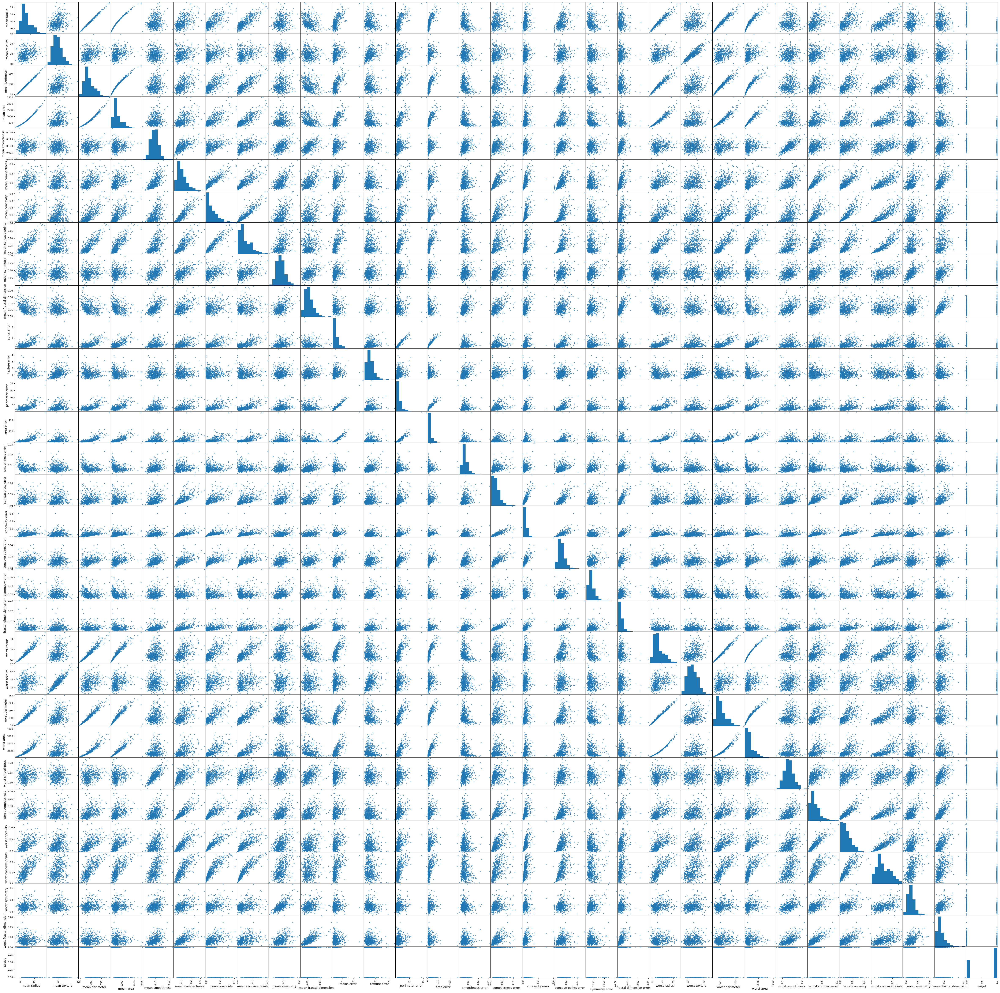

In [19]:
scatter_matrix(df, alpha=0.8, diagonal='hist', figsize=(60, 60))
plt.show()

We see that there are some features who show a correlation, we will investigate further with a heat map

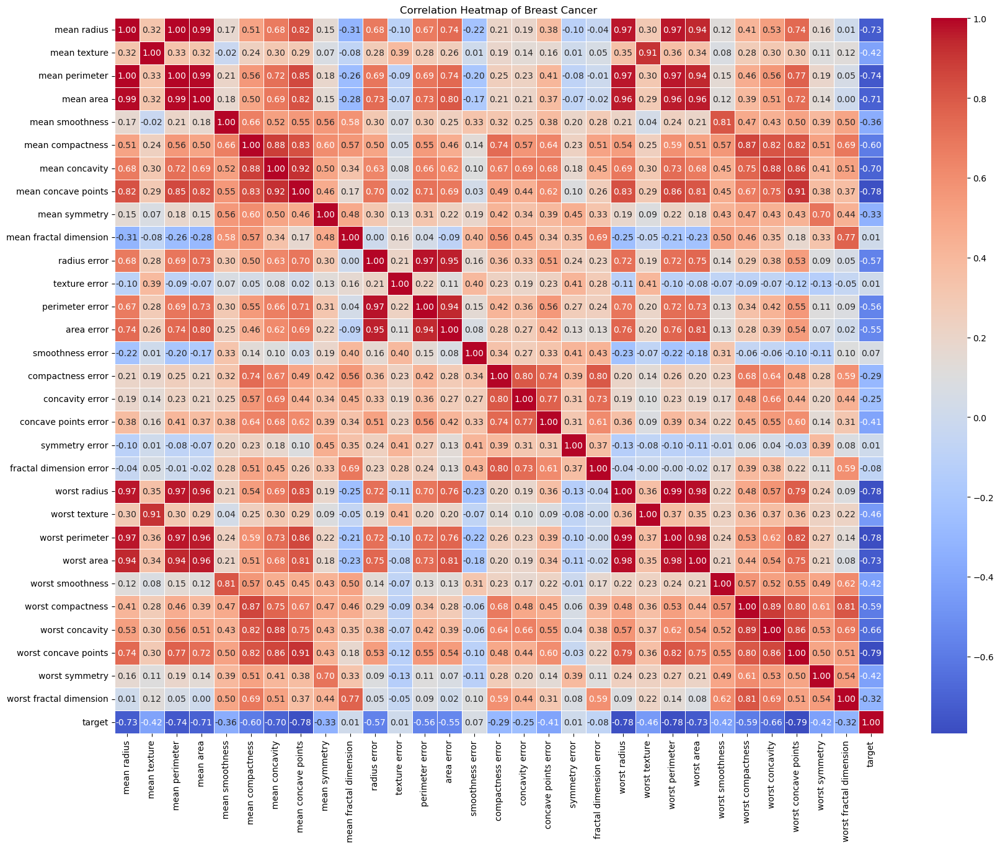

In [20]:
# see the correlation between the variables wiht a heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(df.corr(method= 'pearson'), annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Breast Cancer')
plt.show()

Before we continue with the classifier section we have to preprosece the data, for example we may drop the high correlated columns, or even standarize or normalize the data

---

We will not drop any columns just yet, as we said before we dont know the impact this will have in the classifier, and because we are talking about medical data, we have to be careful for every move we make. We will run the model and maybe do some changes after the run to see if we had a meaningfull change.

---

The context of this assigment is to just use a template and not deliver the best classifier we can(by going back and forth change something evaluate, change something else re-evaluate etc), so this move will has to be done in the assigment 2

## Step 4: Prepare Data
Data Cleaning/Data Wrangling/Collect more data (if necessary).

We see that in the step 3 that there are no missing values in the dataset. There are 2 things we may do.
- Drop some high correlated values

Again we have to test our model before and after each change. But for now we will do it anyway.

In [42]:
df_filtered = df.drop(['mean area', 'worst area','mean perimeter','worst perimeter', 'area error', 'worst radius', 'radius error', 'worst texture', 'mean concave points'], axis=1)

In [43]:
df_filtered.shape

(569, 22)

In [52]:
df_filtered.iloc[:, 21]

0      0
1      0
2      0
3      0
4      0
      ..
564    0
565    0
566    0
567    0
568    1
Name: target, Length: 569, dtype: int64

We will use a standarized method because we have some outliers

In [60]:
array = df_filtered.values
# separate array into input and output components
X = array[:,0:20]
Y = array[:,21]

scaler = StandardScaler().fit(X)
rescaledX = scaler.transform(X)
# summarise transformed data
set_printoptions(precision=3)
print(rescaledX[0:5,:])

[[ 1.097e+00 -2.073e+00  1.568e+00  3.284e+00  2.653e+00  2.218e+00
   2.256e+00 -5.653e-01  2.833e+00 -2.140e-01  1.317e+00  7.240e-01
   6.608e-01  1.149e+00  9.071e-01  1.308e+00  2.617e+00  2.110e+00
   2.296e+00  2.751e+00]
 [ 1.830e+00 -3.536e-01 -8.270e-01 -4.871e-01 -2.385e-02  1.392e-03
  -8.687e-01 -8.762e-01  2.633e-01 -6.054e-01 -6.929e-01 -4.408e-01
   2.602e-01 -8.055e-01 -9.944e-02 -3.756e-01 -4.304e-01 -1.467e-01
   1.087e+00 -2.439e-01]
 [ 1.580e+00  4.562e-01  9.422e-01  1.053e+00  1.363e+00  9.397e-01
  -3.980e-01 -7.801e-01  8.509e-01 -2.970e-01  8.150e-01  2.131e-01
   1.425e+00  2.370e-01  2.936e-01  5.274e-01  1.083e+00  8.550e-01
   1.955e+00  1.152e+00]
 [-7.689e-01  2.537e-01  3.284e+00  3.403e+00  1.916e+00  2.867e+00
   4.911e+00 -1.104e-01  2.866e-01  6.897e-01  2.744e+00  8.195e-01
   1.115e+00  4.733e+00  2.048e+00  3.394e+00  3.893e+00  1.990e+00
   2.176e+00  6.046e+00]
 [ 1.750e+00 -1.152e+00  2.804e-01  5.393e-01  1.371e+00 -9.560e-03
  -5.624e-01 -7.

So we dropped 8 columns and we standarize the data ,and if we want to make changes after, we need to revaluate the changes we did just now

## Step 5: Feature Engineering
Feature selection/feature engineering (as in new features)/data transformations.

Because we dont have categorical values,to make dummy encoding , and the context of the data are not our expertise we will leave the dataset as it is.

## Step 6: Algorithm Selection
Select a set of algorithms to apply, select evaluation metrics, and evaluate/compare algorithms.

Lets do a test
- We will run 5 classifiers to spot check them:
 - The original Dataset
 - The dataset after we drop the 8 columns
 - The preprosed and scaled Dataset

In [76]:
# original dataset
array_2 = df.values
x = array_2[:,0:29]
y = array_2[:,30]

# the X ,Y is the dataset wihtout the correlation
# the rescaledX, Y is the dataset with the standarization
dataset ={
    'original': (x,y),
    'filtered': (X,Y),
    'rescaled': (rescaledX,Y)
}

In [75]:
# initialize the kfold 
kfold = KFold(n_splits=10, shuffle=True, random_state=9)

In [77]:
# we use the logistic regression model and the solver liblinear because it is a small dataset and it is binary classification
for stage, (features, target) in dataset.items():
    accuracy_scores = cross_val_score(LogisticRegression(solver='liblinear'), features, target, cv=kfold)
    print(f"{stage}: Mean Accuracy - {accuracy_scores.mean()}, Std Dev - {accuracy_scores.std()}")

original: Mean Accuracy - 0.9525375939849624, Std Dev - 0.03045501138122285
filtered: Mean Accuracy - 0.9209273182957393, Std Dev - 0.03348679506438917
rescaled: Mean Accuracy - 0.9771929824561404, Std Dev - 0.020832179100066517


In [79]:
# we use the logistic regression model and the solver liblinear because it is a small dataset and it is binary classification
for stage, (features, target) in dataset.items():
    accuracy_scores = cross_val_score(LinearDiscriminantAnalysis(), features, target, cv=kfold)
    print(f"{stage}: Mean Accuracy - {accuracy_scores.mean()}, Std Dev - {accuracy_scores.std()}")

original: Mean Accuracy - 0.9525375939849624, Std Dev - 0.013741138631821114
filtered: Mean Accuracy - 0.9525689223057643, Std Dev - 0.019259249243293936
rescaled: Mean Accuracy - 0.9525689223057643, Std Dev - 0.019259249243293936


In [80]:
for stage, (features, target) in dataset.items():
    accuracy_scores = cross_val_score(KNeighborsClassifier(), features, target, cv=kfold)
    print(f"{stage}: Mean Accuracy - {accuracy_scores.mean()}, Std Dev - {accuracy_scores.std()}")

original: Mean Accuracy - 0.9333020050125314, Std Dev - 0.03903273676728739
filtered: Mean Accuracy - 0.8928884711779448, Std Dev - 0.036197553117276696
rescaled: Mean Accuracy - 0.9595551378446115, Std Dev - 0.015864910348571577


In [81]:
for stage, (features, target) in dataset.items():
    accuracy_scores = cross_val_score(GaussianNB(), features, target, cv=kfold)
    print(f"{stage}: Mean Accuracy - {accuracy_scores.mean()}, Std Dev - {accuracy_scores.std()}")

original: Mean Accuracy - 0.938533834586466, Std Dev - 0.02625373097936261
filtered: Mean Accuracy - 0.9156015037593983, Std Dev - 0.017427221474356692
rescaled: Mean Accuracy - 0.9156015037593983, Std Dev - 0.017427221474356692


In [82]:
for stage, (features, target) in dataset.items():
    accuracy_scores = cross_val_score(DecisionTreeClassifier(), features, target, cv=kfold)
    print(f"{stage}: Mean Accuracy - {accuracy_scores.mean()}, Std Dev - {accuracy_scores.std()}")

original: Mean Accuracy - 0.9349937343358394, Std Dev - 0.03509981498013022
filtered: Mean Accuracy - 0.9260964912280703, Std Dev - 0.03693141326748996
rescaled: Mean Accuracy - 0.924310776942356, Std Dev - 0.043392427283867975


In [84]:
for stage, (features, target) in dataset.items():
    accuracy_scores = cross_val_score(SVC(), features, target, cv=kfold)
    print(f"{stage}: Mean Accuracy - {accuracy_scores.mean()}, Std Dev - {accuracy_scores.std()}")

original: Mean Accuracy - 0.9139411027568922, Std Dev - 0.026431914241628787
filtered: Mean Accuracy - 0.89984335839599, Std Dev - 0.029347146261386733
rescaled: Mean Accuracy - 0.9666040100250626, Std Dev - 0.012291086857478857


In [91]:
from xgboost import XGBClassifier

for stage, (features, target) in dataset.items():
    accuracy_scores = cross_val_score(XGBClassifier(), features, target, cv=kfold)
    print(f"{stage}: Mean Accuracy - {accuracy_scores.mean()}, Std Dev - {accuracy_scores.std()}")

original: Mean Accuracy - 0.968421052631579, Std Dev - 0.0291460486418178
filtered: Mean Accuracy - 0.963095238095238, Std Dev - 0.01992136364604669
rescaled: Mean Accuracy - 0.963095238095238, Std Dev - 0.01992136364604669


In [92]:
# Create a list, with one item per algorithm. Each item has a name, and a classifier object.
models = []
models.append(('LR',  LogisticRegression(solver='liblinear')))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('kNN', KNeighborsClassifier()))
models.append(('DT',  DecisionTreeClassifier()))
models.append(('NB',  GaussianNB()))
models.append(('SVM', SVC()))
models.append(('XB',  XGBClassifier()))

In [96]:
# We are going to evaluate all classifiers, and store results in two lists:
results = []
names   = []
for name, model in models:
  cv_results = cross_val_score(model, rescaledX, Y, cv=kfold)
  results.append(cv_results)
  names.append(name)
  print("%03s: %f (+/- %f)" % (name, cv_results.mean(), cv_results.std()))

 LR: 0.977193 (+/- 0.020832)
LDA: 0.952569 (+/- 0.019259)
kNN: 0.959555 (+/- 0.015865)
 DT: 0.931360 (+/- 0.034059)
 NB: 0.915602 (+/- 0.017427)
SVM: 0.966604 (+/- 0.012291)
 XB: 0.963095 (+/- 0.019921)


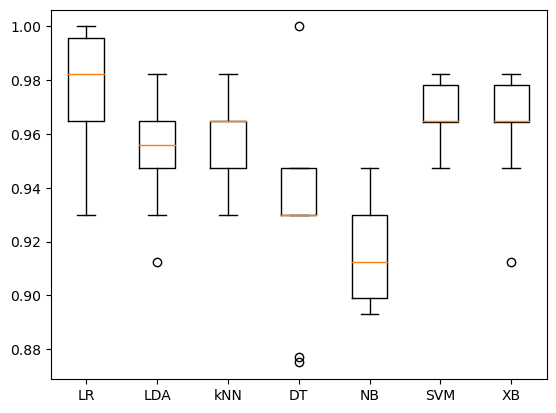

In [97]:
plt.boxplot(results)
plt.xticks(list(range(1,len(names)+1)), names)
plt.show()

As we can see some classifiers like xgboost and decision trees are doing fine with the original dataset, because the original dataset is not so coplicated we can say that all the clasifiers are going to work in this dataset.But for abvriviation of assigment we will select the logistic regression in the nextstep as it has the highest accuracy

## Step 7: Model Training
Apply ensembles and improve performance by hyperparameter optimisation.

We applied an ensembler in the previus step (XGBOOST)

In [112]:
voting_classifier = VotingClassifier(estimators=[
    ('lr', LogisticRegression()),
    ('svm', SVC(probability=True)),
    ('dt', DecisionTreeClassifier())
], voting='soft')

results = cross_val_score(voting_classifier, features, target, cv=kfold)
print(results.mean())

0.9683583959899748


In [113]:
# Create a BaggingClassifier
bagging_classifier = BaggingClassifier(LogisticRegression(), n_estimators=10, random_state=42)
results = cross_val_score(bagging_classifier, features, target, cv=kfold)
print (results.mean())

0.9736842105263157


## Step 8: Finalise Model
Predictions on validation set, create model from the entire (training) dataset.